In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch


from IPython.display import display
from PIL import Image as Img

from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable

In [2]:
train_df = pd.read_csv("./data/train.csv")

test_df = pd.read_csv('data/sample_submission.csv')

input_path = "./data/cropped_train_images"

root_in = '../data'
root_out = './'# root_out give the folder direciton of after-processed images, csv..

train_df["species"].replace({"kiler_whale": "killer_whale", "bottlenose_dolpin": "bottlenose_dolphin"}, inplace=True)

from os.path import exists

def image_exists(imdbid):
    filepath = f"data/cropped_train_images/{imdbid}"
    return os.path.isfile(filepath)

train_df = train_df[train_df['image'].apply(image_exists)]

print(train_df.head(50))

                 image               species individual_id
0   00021adfb725ed.jpg    melon_headed_whale  cadddb1636b9
1   000562241d384d.jpg        humpback_whale  1a71fbb72250
2   0007c33415ce37.jpg    false_killer_whale  60008f293a2b
3   0007d9bca26a99.jpg    bottlenose_dolphin  4b00fe572063
5   000a8f2d5c316a.jpg    bottlenose_dolphin  b9907151f66e
6   000be9acf46619.jpg                beluga  afb9b3978217
7   000bef247c7a42.jpg        humpback_whale  444d8894ccc8
8   000c3d63069748.jpg                beluga  df94b15285b9
9   000c476c11bad5.jpg    bottlenose_dolphin  b11b2404c7e3
10  001001f099519f.jpg           minke_whale  19fbb960f07d
11  00103cbe9d25ce.jpg             fin_whale  180c0ab04dcd
12  00144776eb476d.jpg    bottlenose_dolphin  b9907151f66e
13  00167e8375c967.jpg                beluga  0ad50d0d9b06
14  00177f3c614d1e.jpg    bottlenose_dolphin  812be36c2aef
15  0017b3749cd769.jpg    bottlenose_dolphin  445270d9ad52
16  0018064338b499.jpg            blue_whale  4790ec3461

37c7aba965a5    343
a6e325d8e924    141
c995c043c353    141
281504409737    138
19fbb960f07d    136
b9907151f66e    133
f195c38bcf17    132
9e89f8e28807    129
c27db73f0e3b    128
956562ff2888    124
Name: individual_id, dtype: int64


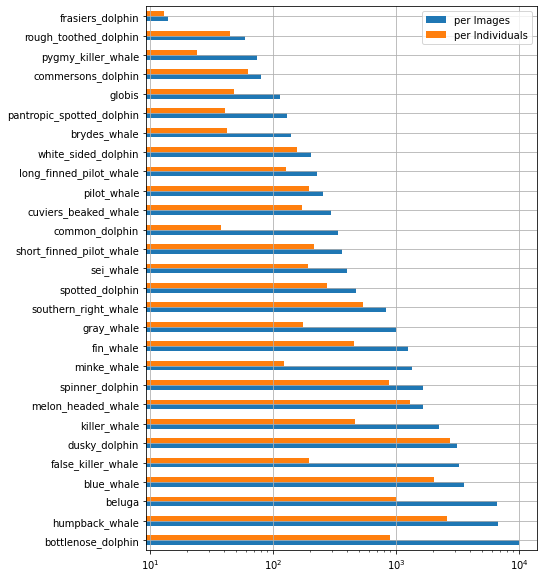

In [3]:
print(train_df.individual_id.value_counts().head(10))

counts_imgs = train_df["species"].value_counts()
counts_inds = train_df.drop_duplicates("individual_id")["species"].value_counts()

ax = pd.concat({"per Images": counts_imgs, "per Individuals": counts_inds}, axis=1).plot.barh(grid=True, figsize=(7, 10))
ax.set_xscale('log')

In [4]:
import numpy as np
from pprint import pprint

species_individuals = {}
for name, dfg in train_df.groupby("species"):
    species_individuals[name] = dfg["individual_id"].value_counts()

si_max = max(list(map(len, species_individuals.values())))
si = {n: [0] * si_max for n in species_individuals}
for n, counts in species_individuals.items():
    si[n][:len(counts)] = list(np.log(counts))
si = pd.DataFrame(si)

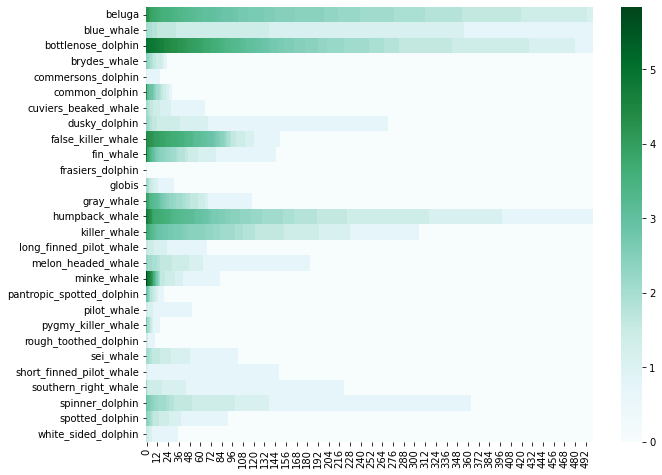

In [5]:
import seaborn as sn

fig = plt.figure(figsize=(10, 8))
ax = sn.heatmap(si[:500].T, cmap="BuGn", ax=fig.gca())

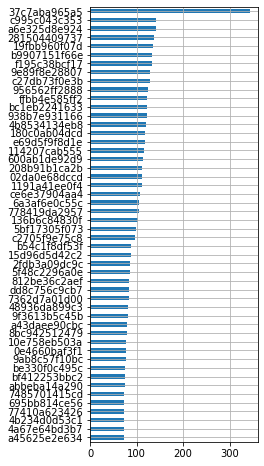

In [6]:
ax = train_df["individual_id"].value_counts(ascending=True)[-50:].plot.barh(figsize=(3, 8), grid=True)  # ascending=True

In [7]:
import os
from matplotlib.patches import Rectangle

yolo_model = torch.hub.load('ultralytics/yolov5', 'custom', path='data/best2.pt')

PATH_DATASET='data'

nb_species = len(train_df["species"].unique())

fig, axarr = plt.subplots(ncols=5, nrows=nb_species, figsize=(12, nb_species * 2))

for i, (name, dfg) in enumerate(train_df.groupby("species")):
    axarr[i, 0].set_title(name)
    for j, (_, row) in enumerate(dfg[:5].iterrows()):
        im_path = os.path.join(PATH_DATASET, "cropped_train_images", row["image"])
        img = plt.imread(im_path)
        results = yolo_model(im_path).pandas().xyxy[0]
        if len(results)>0:
            results=results.iloc[:1]
            
            w, h = int(results.xmax)-int(results.xmin), int(results.ymax)-int(results.ymin)
            shape = [(results['xmin'], results['ymin']), (w , h )]            
            axarr[i, j].add_patch(Rectangle((int(results['xmin']), int(results['ymin'])), w, h, edgecolor = 'red',
                facecolor = 'blue',
                fill=False,
                lw=3))
            axarr[i, j].imshow(img)
            axarr[i, j].set_axis_off()
        else:
            axarr[i, j].imshow(img)
            axarr[i, j].set_axis_off()

Using cache found in C:\Users\juanj/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2022-4-14 torch 1.11.0+cpu CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
Adding AutoShape... 


Error in callback <function flush_figures at 0x0000020183424DC0> (for post_execute):


KeyboardInterrupt: 

In [8]:
from keras.models import load_model
import tensorflow as tf

model=load_model('happywhales_nnmodel')

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 32)        9

In [9]:
def decode_img(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size  
  return tf.image.resize_with_pad(img, img_height, img_width)

def decode_img2(img,box):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size  
  img = tf.image.crop_to_bounding_box(img, box[0],box[1],box[2],box[3])
  return tf.image.resize_with_pad(img, img_height, img_width)  

C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1661605336.py:48: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


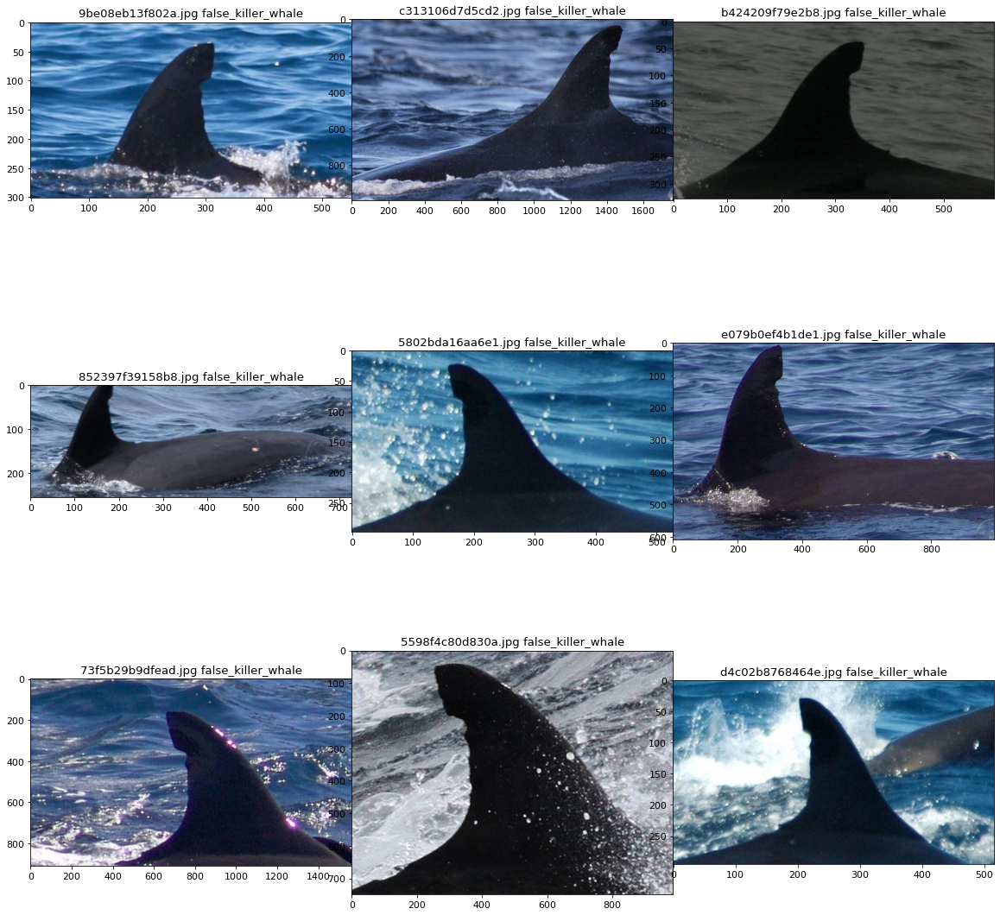

In [10]:
import cv2
import kornia as K
import kornia.feature as KF
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from kornia_moons.feature import *
from PIL import Image

im_path =  './data/cropped_train_images/' 

class_names=train_df["species"].unique()
img_height=256
img_width=256


train_df.species.value_counts().head(8)

# I can just take one flase killer whale to watch them 
train_df.query("species=='spinner_dolphin'").individual_id.value_counts().head(5)

def plot_whales(im_path):
    
    fig, axes = plt.subplots(3, 3, figsize=(20,20))
    
    for idx, img in enumerate(img_to_draw):
        i = idx % 3 
        j = idx // 3 
        image = Image.open(im_path + img)
        iar_shp = np.array(image).shape
        
        kimg = tf.io.read_file(im_path + img)
        kimg = decode_img(kimg)
        img_array = tf.keras.utils.img_to_array(kimg)
        img_array = tf.expand_dims(img_array, 0) # Create a batch

        predictions = model.predict(img_array)
        score = tf.nn.softmax(predictions[0])

        species1=class_names[np.argmax(score)]

        axes[i, j].imshow(image)
        axes[i, j].set_title(img+' '+str(species1))

    plt.subplots_adjust(wspace=0, hspace=.2)
    plt.show()

img_to_draw = [file for file in train_df.query("individual_id == 'bfb74132d1db'").sample(9).image]
#img_to_draw = [file for file in train_df.sample(9).image]

plot_whales(im_path)

C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
C:\Users\juanj\AppData\Local\Temp\ipykernel_5044\1513953152.py:40: UserWarning: Matpl

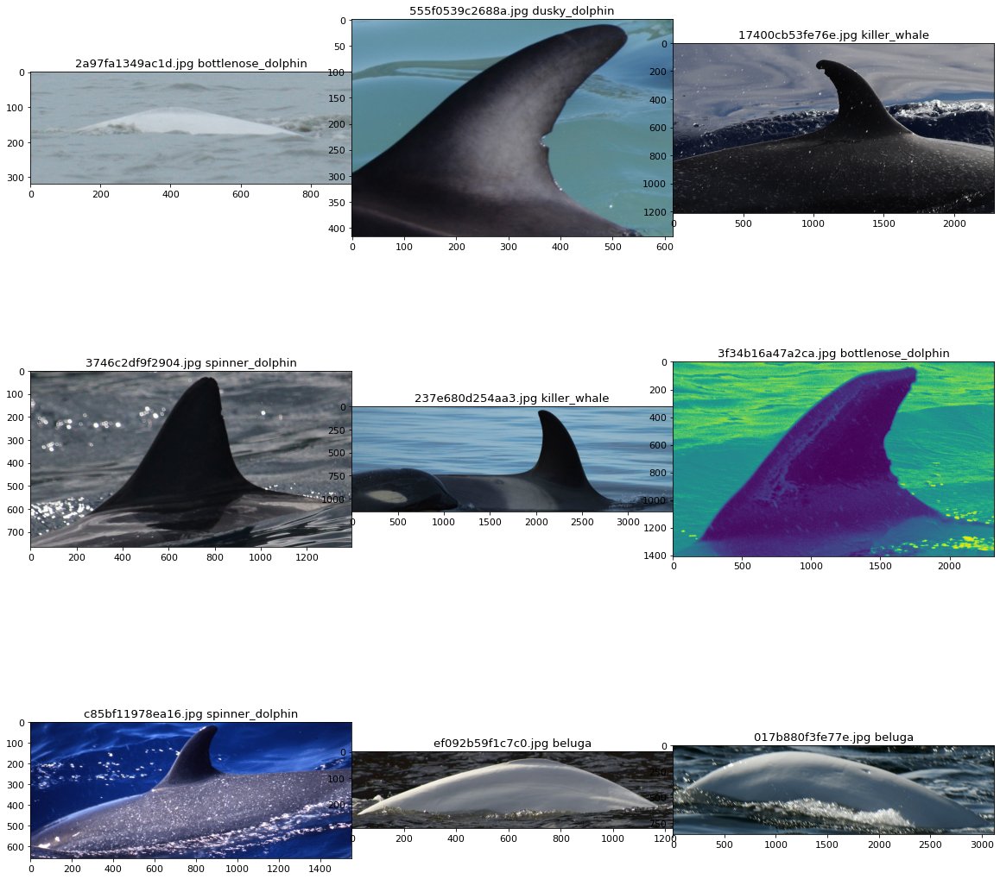

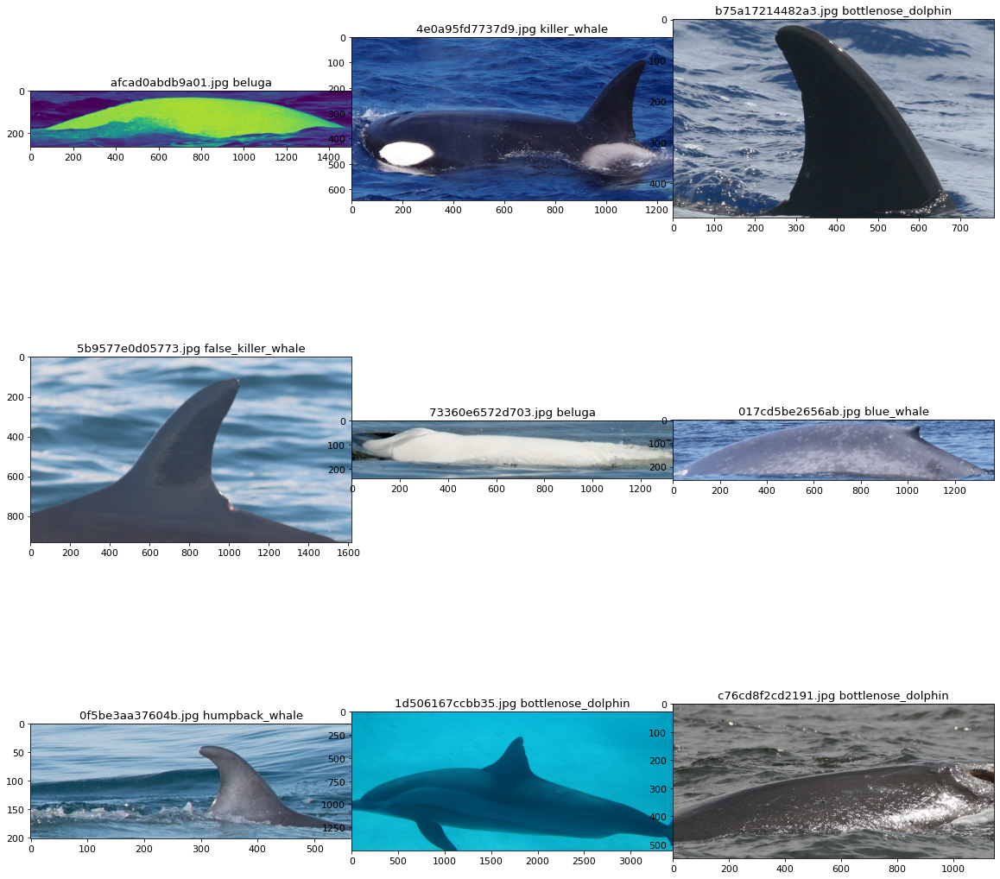

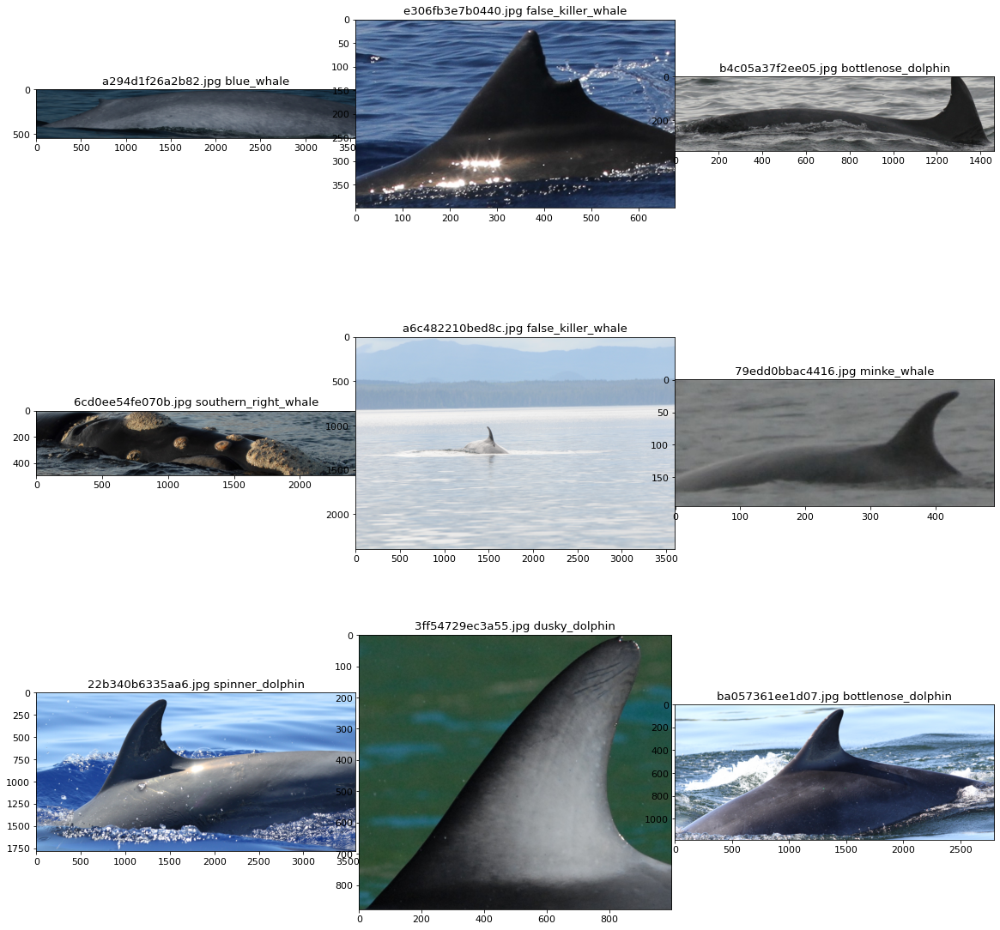

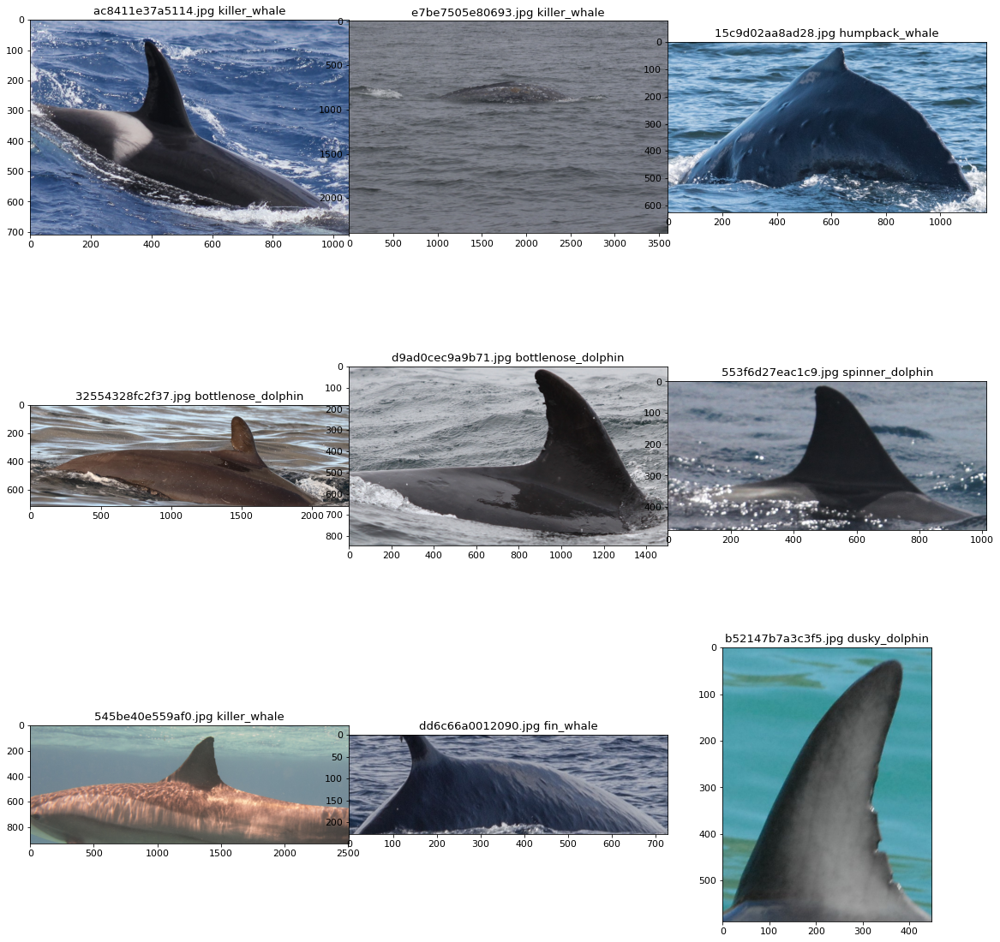

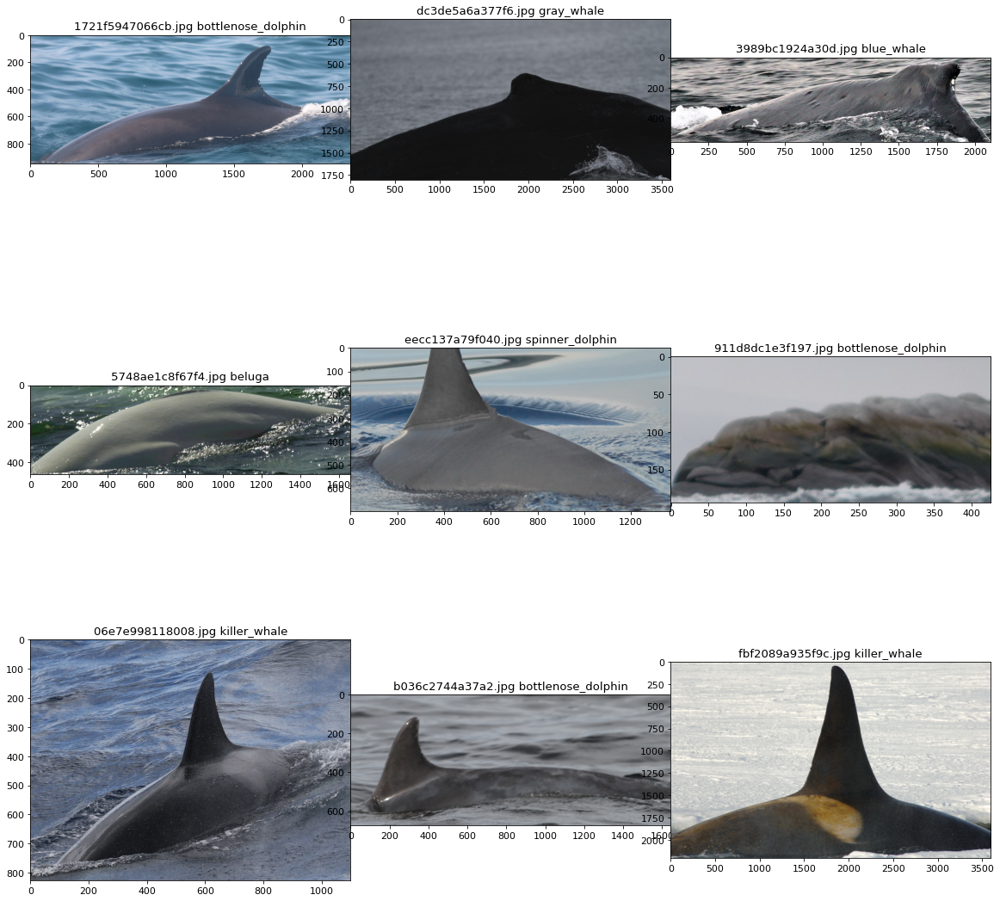

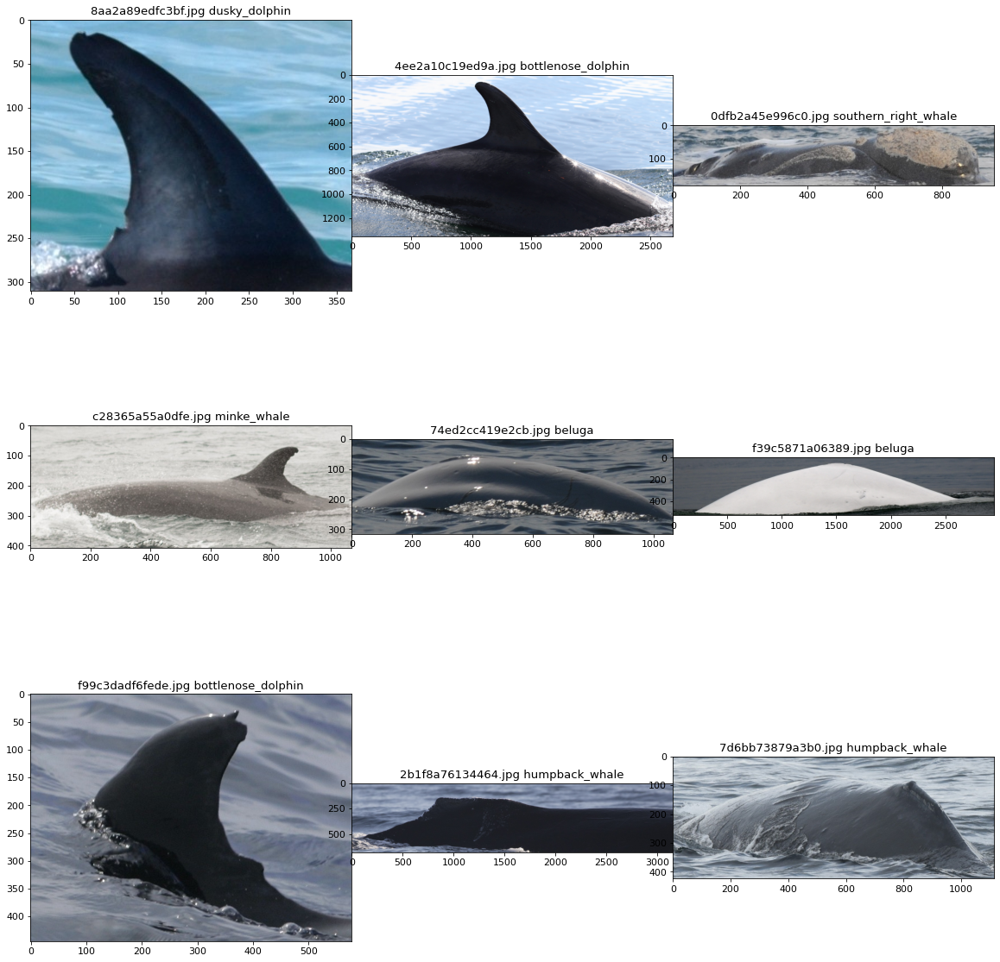

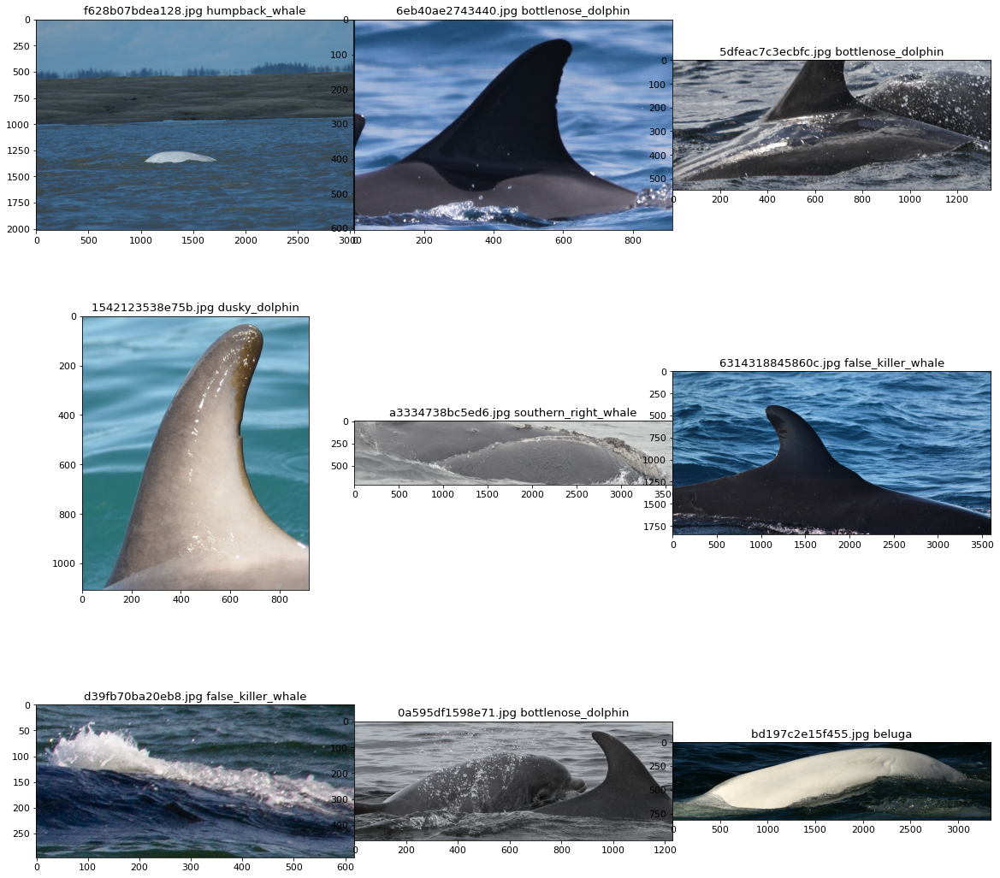

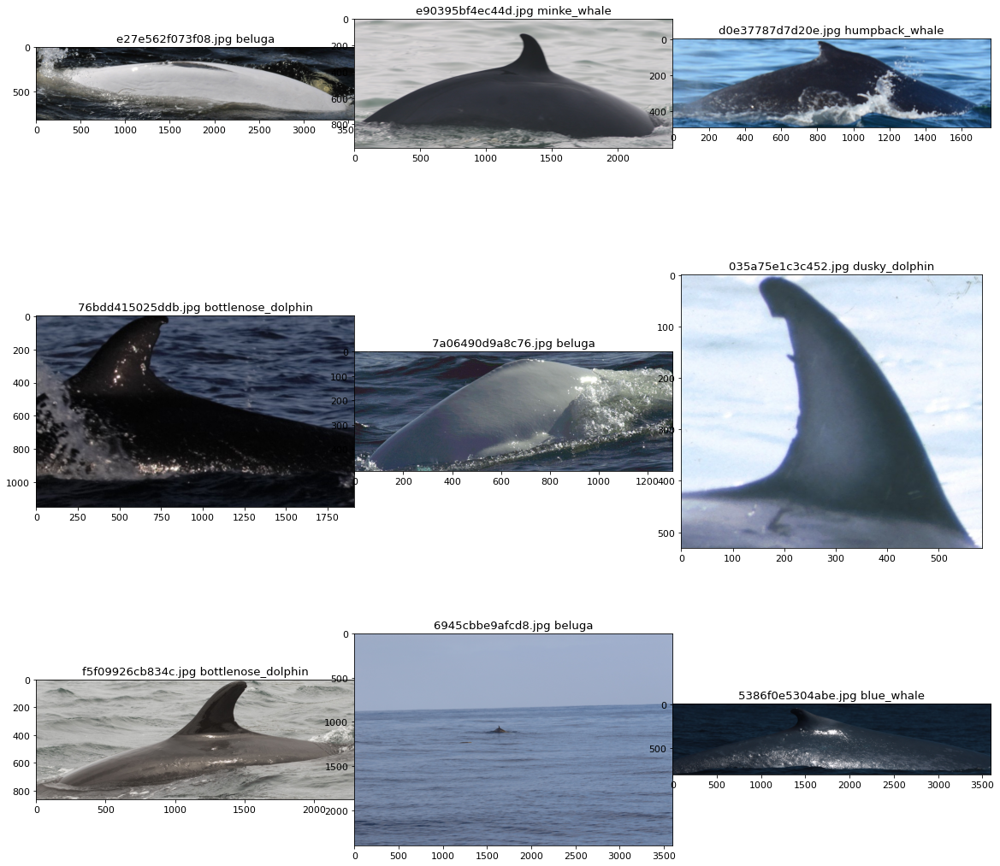

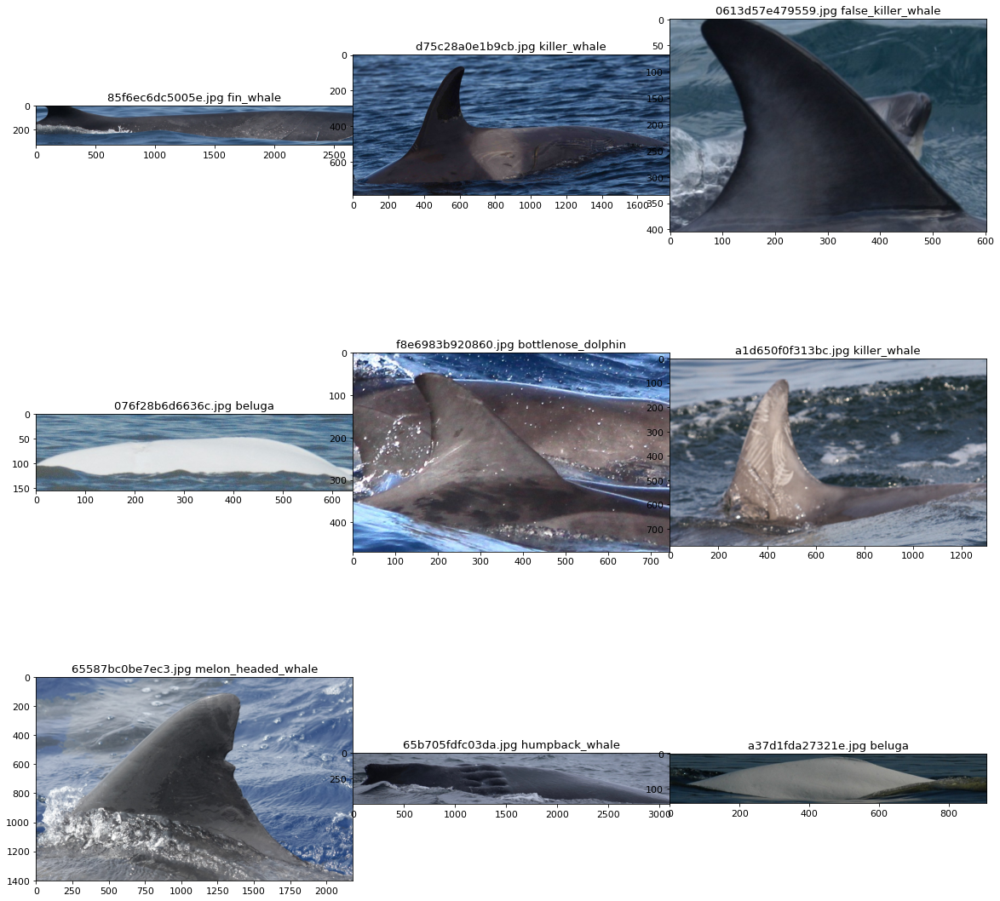

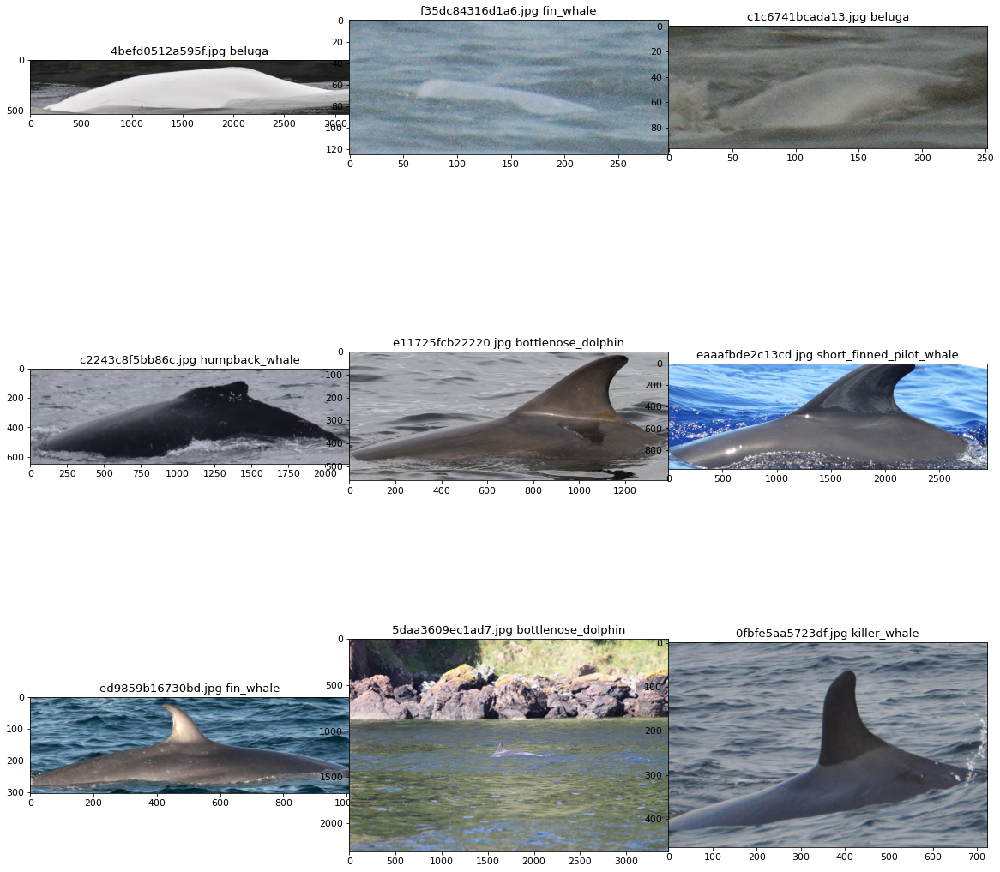

In [13]:
realtest_df=pd.read_csv("./data/sample_submission.csv")
realtest_df=realtest_df.sample(90)

k=0
for index,row in realtest_df.head(90).iterrows():
    img= row['image']

    results = yolo_model('data/test_images/' + img).pandas().xyxy[0]
    if len(results)>0:
        results=results.iloc[:1]
        
        w, h = int(results.xmax)-int(results.xmin), int(results.ymax)-int(results.ymin)
        shape = [int(results['ymin']), int(results['xmin']), h , w ] 
        #print(shape)
        
        kimg = tf.io.read_file('data/test_images/' + img)
        kimg = decode_img2(kimg,shape)
        img_array = tf.keras.utils.img_to_array(kimg)
        img_array = tf.expand_dims(img_array, 0) # Create a batch

        predictions = model.predict(img_array)
        score = tf.nn.softmax(predictions[0])

        species1=class_names[np.argmax(score)]
        #print(row['image']+' -> '+species1)

    image = Image.open('data/test_images/' + img)
    if len(results)>0:
        image=image.crop((int(results['xmin']), int(results['ymin']), int(results['xmax']) , int(results['ymax']) ))
    if k==0:
        ig, axes = plt.subplots(3, 3, figsize=(20,20))
    i = k % 3 
    j = k // 3 
    axes[i][j].imshow(image)
    axes[i][j].set_title(img+' '+species1)

    k = k+1
    if k==9:
        plt.subplots_adjust(wspace=0, hspace=.2)
        plt.show()
        k = 0


In [12]:
import tensorflow as tf



def match_and_draw(im_path, img_in1, img_in2):
    img1=cv2.imread(im_path + img_in1)
    img2=cv2.imread(im_path + img_in2)
    
    
    img = tf.keras.utils.load_img(
        im_path + img_in1, target_size=(img_height, img_width)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = model.predict(img_array)
    score = tf.nn.softmax(predictions[0])

    species1=class_names[np.argmax(score)]

    '''print(
        "This image most likely belongs to {} with a {:.2f} percent confidence."
        .format(class_names[np.argmax(score)], 100 * np.max(score))
    )'''

    img = tf.keras.utils.load_img(
        im_path + img_in2, target_size=(img_height, img_width)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = model.predict(img_array)
    score = tf.nn.softmax(predictions[0])

    species2=class_names[np.argmax(score)]

    '''print(
        "This image most likely belongs to {} with a {:.2f} percent confidence."
        .format(class_names[np.argmax(score)], 100 * np.max(score))
    )'''

    #img1 = load_torch_image(im_path + img_in1)
    #img2 = load_torch_image(im_path + img_in2)
    
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    axes[0].imshow(img1)
    axes[0].set_title(img_in1+' '+species1)
    axes[1].imshow(img2)
    axes[1].set_title(img_in2+' '+species2)

    plt.subplots_adjust(wspace=0, hspace=.2)
    plt.show()


In [ ]:
img_to_draw = [file for file in train_df.query("individual_id == 'afb9b3978217'").image]
random_samples = np.random.randint(len(img_to_draw), size=(2, 15))

for i in range(random_samples.shape[1]):
    whale_1 = img_to_draw[random_samples[0][i]]
    whale_2 = img_to_draw[random_samples[1][i]]
    print(f'Matching: {whale_1} to {whale_2}')
    match_and_draw(im_path, whale_1, whale_2)

xxxxxxxxxx

In [ ]:
from PIL import Image, ImageDraw
import matplotlib.patches as patches

x=train_df.loc[train_df['species']=='beluga']
img_to_draw=input_path+'/'+x['image']

#print(img_to_draw)

fig, axes = plt.subplots(10, 5, figsize=(20,20))

model = torch.hub.load('ultralytics/yolov5', 'custom', path='data/best2.pt')
#model = torch.hub.load('ultralytics/yolov5', 'yolov5m')

for idx, img in enumerate(img_to_draw[50:100]):
    
    j = idx % 5 
    i = idx // 5
    image = Img.open(img)
    results = model(img).pandas().xyxy[0]
    #print(results)

    #iar_shp = np.array(image).shape
    if len(results)>0:
        results=results.iloc[:1]
        img1 = ImageDraw.Draw(image)  
        w, h = int(results.xmax)-int(results.xmin), int(results.ymax)-int(results.ymin)
        shape = [(results['xmin'], results['ymin']), (w , h )]
        axes[i, j].axis('off')
        axes[i, j].add_patch(patches.Rectangle((int(results['xmin']), int(results['ymin'])), w, h, edgecolor = 'red',
             facecolor = 'blue',
             fill=False,
             lw=3))
        axes[i, j].imshow(image)
    else:
        print(img)
    
    
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()